# Проект: поиск похожих изображений.
Он включает в себя:
- сборку общего датасета фотографий с цветами;
- генерацию tenserflow dataseta для обучения собственноручно написанной свёрточной сети (функция генерации датасета реализована собственноручно, как аналог tf.keras.utils.image_dataset_from_directory);
- Реализация и обучение модели свёрточной нейронной сети;
- Реализация подходов поиска похожих фотографий;
- Также реализация и тестирование других подходов, в которых не используется обученная модель (пункт 4) или тестируется готовая предобученная модель (пункт 5).

Данный проект также выложен на Github: https://github.com/DronBit/Search-for-similar-pictures

-----

In [2]:
import os
import pickle
import tarfile
import datetime
import zipfile
import urllib.request

import tensorflow as tf
import tensorflow_datasets.public_api as tfds
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing import image
import keras

import matplotlib.pyplot as plt
import matplotlib.image as mpimg

import numpy as np
import pandas as pd
import cv2
import scipy.io

import sklearn.metrics
from sklearn.neighbors import NearestNeighbors
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.manifold import TSNE
from tqdm.notebook import tqdm

from PIL import Image
from IPython.display import clear_output

2024-09-22 23:55:44.119236: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-09-22 23:55:44.514835: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-09-22 23:55:45.367051: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


In [3]:
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
        for gpu in gpus:
              tf.config.experimental.set_memory_growth(gpu, True)
    except RuntimeError as e:
        print(e)

2024-09-22 23:55:49.049951: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:984] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-09-22 23:55:49.240101: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:984] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-09-22 23:55:49.240166: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:984] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.


----
# 1. Download dataset

- Датасет Flowers Recognition - имеет уже собранную структуру с train и val с классами в своих папках.  
- Датасет Petals to the Metal (tfrecords-jpeg) - фотографии и метки классов находятся в файлах формата tfrec - необходимо их считать и разбить по папкамм классов.  
- Датасет oxford flowers102 - загружаем с помощью tfds.load и созраняем в директорию.

Итоговый собранный датасет был помещён в одну директорию: All flowers, архив которой находится в проекте на Github. Рекомендуется загрузить этот архив и использовать его, а не загружать датасеты зановой и собирать их!!! Так как это займёт больше времени, а также после объединения, названия подпапок с классами корректировались дополнительно в ручную, так как один и тот же класс мог иметь либо разные названия, либо ошибки в названии, а при разработке использовались названия классов, поэтому при новой сборке датасета могу возникнуть различия в реализации.

In [2]:
zip_path = 'archive.zip'

base_extract_path = 'Flowers Recognition/'

archive_name = os.path.splitext(os.path.basename(zip_path))[0]

extract_path = os.path.join(base_extract_path, archive_name)

os.makedirs(extract_path, exist_ok=True)

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

In [3]:
zip_path = 'tfrecords-jpeg-224x224.zip'

base_extract_path = 'tfrecords/'

archive_name = os.path.splitext(os.path.basename(zip_path))[0]

extract_path = os.path.join(base_extract_path, archive_name)

os.makedirs(extract_path, exist_ok=True)

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

In [2]:
CLASSES = ['pink primrose',    'hard-leaved pocket orchid', 'canterbury bells', 'sweet pea',     'wild geranium',     'tiger lily',
           'moon orchid',              'bird of paradise', 'monkshood',        'globe thistle',         # 00 - 09
           'snapdragon',       "colt's foot",               'king protea',      'spear thistle', 'yellow iris',       'globe-flower',
           'purple coneflower',        'peruvian lily',    'balloon flower',   'giant white arum lily', # 10 - 19
           'fire lily',        'pincushion flower',         'fritillary',       'red ginger',    'grape hyacinth',    'corn poppy',
           'prince of wales feathers', 'stemless gentian', 'artichoke',        'sweet william',         # 20 - 29
           'carnation',        'garden phlox',              'love in the mist', 'cosmos',        'alpine sea holly',  'ruby-lipped cattleya',
           'cape flower',              'great masterwort', 'siam tulip',       'lenten rose',           # 30 - 39
           'barberton daisy',  'daffodil',                  'sword lily',       'poinsettia',    'bolero deep blue',  'wallflower',
           'marigold',                 'buttercup',        'daisy',            'common dandelion',      # 40 - 49
           'petunia',          'wild pansy',                'primula',          'sunflower',     'lilac hibiscus',    'bishop of llandaff', 
           'gaura',                    'geranium',         'orange dahlia',    'pink-yellow dahlia',    # 50 - 59
           'cautleya spicata', 'japanese anemone',          'black-eyed susan', 'silverbush',    'californian poppy', 'osteospermum',
           'spring crocus',            'iris',             'windflower',       'tree poppy',            # 60 - 69
           'gazania',          'azalea',                    'water lily',       'rose',          'thorn apple',       'morning glory',
           'passion flower',           'lotus',            'toad lily',        'anthurium',             # 70 - 79
           'frangipani',       'clematis',                  'hibiscus',         'columbine',     'desert-rose',       'tree mallow', 
           'magnolia',                 'cyclamen ',        'watercress',       'canna lily',            # 80 - 89
           'hippeastrum ',     'bee balm',                  'pink quill',       'foxglove',      'bougainvillea',     'camellia', 
           'mallow',                   'mexican petunia',  'bromelia',         'blanket flower',        # 90 - 99
           'trumpet creeper',  'blackberry lily',           'common tulip',     'wild rose'
]

feature_description = {
    'id': tf.io.FixedLenFeature([], tf.string),
    'class': tf.io.FixedLenFeature([], tf.int64),
    'image': tf.io.FixedLenFeature([], tf.string)
}

def _parse_function(example_proto):
    return tf.io.parse_single_example(example_proto, feature_description)

def save_images_from_tfrecord(tfrecord_paths, output_dir):

    tfrecord_paths = list(tfrecord_paths.as_numpy_iterator())
    
    dataset = tf.data.Dataset.from_tensor_slices(tfrecord_paths)
    dataset = dataset.interleave(lambda x: tf.data.TFRecordDataset(x), cycle_length=4)
    dataset = dataset.map(_parse_function)

    os.makedirs(output_dir, exist_ok=True)

    for example in dataset:
        image_id = example['id'].numpy().decode('utf-8')
        image = example['image'].numpy()
        label = example['class'].numpy()

        image = tf.image.decode_image(image)
        image = Image.fromarray(image.numpy())

        label_dir = os.path.join(output_dir, str(CLASSES[label]))
        os.makedirs(label_dir, exist_ok=True)

        image_path = os.path.join(label_dir, f'{image_id}.jpg')
        image.save(image_path)

train_tfrecord_paths = tf.data.Dataset.list_files('tfrecords/train/*.tfrec')
val_tfrecord_paths = tf.data.Dataset.list_files('tfrecords/val/*.tfrec')

train_output_dir = 'tfrecords/train/'
val_output_dir = 'tfrecords/val/'

save_images_from_tfrecord(train_tfrecord_paths, train_output_dir)
save_images_from_tfrecord(val_tfrecord_paths, val_output_dir)

2024-08-28 19:29:24.622668: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:984] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-08-28 19:29:24.823579: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:984] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-08-28 19:29:24.823623: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:984] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-08-28 19:29:24.826025: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:984] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-08-28 19:29:24.826063: I external/local_xla/xla/stream_executor

In [ ]:
dataset, info = tfds.load('oxford_flowers102', as_supervised=True, with_info=True)

In [3]:
_NAMES = [
    "pink primrose",
    "hard-leaved pocket orchid",
    "canterbury bells",
    "sweet pea",
    "english marigold",
    "tiger lily",
    "moon orchid",
    "bird of paradise",
    "monkshood",
    "globe thistle",
    "snapdragon",
    "colt's foot",
    "king protea",
    "spear thistle",
    "yellow iris",
    "globe-flower",
    "purple coneflower",
    "peruvian lily",
    "balloon flower",
    "giant white arum lily",
    "fire lily",
    "pincushion flower",
    "fritillary",
    "red ginger",
    "grape hyacinth",
    "corn poppy",
    "prince of wales feathers",
    "stemless gentian",
    "artichoke",
    "sweet william",
    "carnation",
    "garden phlox",
    "love in the mist",
    "mexican aster",
    "alpine sea holly",
    "ruby-lipped cattleya",
    "cape flower",
    "great masterwort",
    "siam tulip",
    "lenten rose",
    "barbeton daisy",
    "daffodil",
    "sword lily",
    "poinsettia",
    "bolero deep blue",
    "wallflower",
    "marigold",
    "buttercup",
    "oxeye daisy",
    "common dandelion",
    "petunia",
    "wild pansy",
    "primula",
    "sunflower",
    "pelargonium",
    "bishop of llandaff",
    "gaura",
    "geranium",
    "orange dahlia",
    "pink-yellow dahlia?",
    "cautleya spicata",
    "japanese anemone",
    "black-eyed susan",
    "silverbush",
    "californian poppy",
    "osteospermum",
    "spring crocus",
    "bearded iris",
    "windflower",
    "tree poppy",
    "gazania",
    "azalea",
    "water lily",
    "rose",
    "thorn apple",
    "morning glory",
    "passion flower",
    "lotus",
    "toad lily",
    "anthurium",
    "frangipani",
    "clematis",
    "hibiscus",
    "columbine",
    "desert-rose",
    "tree mallow",
    "magnolia",
    "cyclamen",
    "watercress",
    "canna lily",
    "hippeastrum",
    "bee balm",
    "ball moss",
    "foxglove",
    "bougainvillea",
    "camellia",
    "mallow",
    "mexican petunia",
    "bromelia",
    "blanket flower",
    "trumpet creeper",
    "blackberry lily",
]

In [4]:
train_dataset = dataset['train']
test_dataset = dataset['test']
valid_dataset = dataset['validation']

In [5]:
d = iter(train_dataset)

In [13]:
img, l = next(d)

Text(0.5, 1.0, 'gazania')

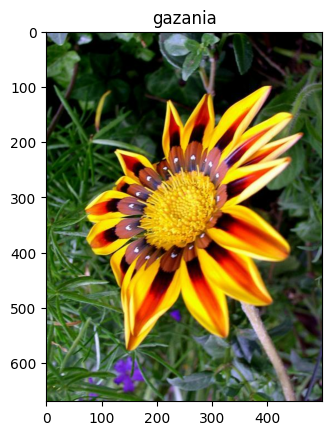

In [14]:
plt.imshow(img)
plt.title(f'{_NAMES[l]}')

In [21]:
output_dir = 'oxford_flowers102_images'
os.makedirs(output_dir, exist_ok=True)

In [22]:
def save_images(dataset, dataset_type, names):
    for image, label in tfds.as_numpy(dataset):
        class_dir = os.path.join(output_dir, dataset_type, str(names[label]))
        os.makedirs(class_dir, exist_ok=True)
        image_path = os.path.join(class_dir, f'{len(os.listdir(class_dir))}.jpg')
        tf.keras.utils.save_img(image_path, image)

In [23]:
save_images(train_dataset, 'train', _NAMES)

2024-09-01 17:20:08.266931: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


In [24]:
save_images(test_dataset, 'test', _NAMES)

2024-09-01 17:24:50.767170: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


In [25]:
save_images(valid_dataset, 'val', _NAMES)

2024-09-01 17:25:52.193626: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


In [6]:
!pip install split-folders

In [40]:
import sys
print(sys.executable)

/home/dron46/anaconda3/envs/tf/bin/python


In [9]:
import splitfolders

input_folder = 'Flowers Recognition/'
output_folder = 'Flowers Recognition split/'

splitfolders.ratio(input_folder, output=output_folder, seed=1337, ratio=(0.8, 0.1, 0.1))

Copying files: 4317 files [06:04, 11.83 files/s]


Объединение датасетов в одну общую директорию

In [15]:
import os
import shutil


source_folders = [
    'Flowers Recognition split/',
    'tfrecords/',
    'oxford_flowers102_images/'
]

target_folder = 'All_flowers'

os.makedirs(os.path.join(target_folder, 'train'), exist_ok=True)
os.makedirs(os.path.join(target_folder, 'val'), exist_ok=True)

def copy_files(source_dir, target_dir):
    for root, dirs, files in os.walk(source_dir):
        for file in files:

            rel_path = os.path.relpath(root, source_dir)

            target_path = os.path.join(target_dir, rel_path)
            os.makedirs(target_path, exist_ok=True)

            shutil.copy(os.path.join(root, file), os.path.join(target_path, file))

for source_folder in source_folders:
    train_source = os.path.join(source_folder, 'train')
    val_source = os.path.join(source_folder, 'val')
    
    copy_files(train_source, os.path.join(target_folder, 'train'))
    copy_files(val_source, os.path.join(target_folder, 'val'))

print("Объединение завершено.")

Объединение завершено.


----
# 2. Генерация dataset train и val

In [21]:
def image_dataset_from_directory(
    directory: str,
    image_size: tuple[int, int]=(256, 256),
    batch_size: int = 32,
    shuffle: bool = True,
    seed: int | None = None,
    validation_split: float | None = None,
    subset: str | None = None
) -> tf.data.Dataset:

    def read_image(path: tf.Tensor) -> tf.Tensor:
        img = tf.io.read_file(path)
        img = tf.io.decode_image(img, channels=3, expand_animations=False)
        img = tf.image.convert_image_dtype(img, tf.float32)
        
        img = tf.image.resize_with_pad(img, *image_size)
        return img
        
    if (subset is not None) != (validation_split is not None):
        raise ValueError("If 'subset' is set, 'validation_split' must be set, and inversely.")

    if subset not in {"both", "training", "validation", None}:
        raise ValueError(
            '`subset` must be either "both", "training", "validation", 'f"received: {subset}"
        )

    class_names = []
    paths = []
    labels = []
    for class_name in os.listdir(directory): 
        class_path = os.path.join(directory, class_name)
        
        if not os.path.isdir(class_path):
            continue

        class_label = len(class_names)
        class_names.append(class_name)

        for file in os.listdir(class_path):
            if os.path.isdir(os.path.join(class_path, file)):
                continue
            paths.append(os.path.join(class_path, file))
            labels.append(class_label)
            
    paths = np.array(paths)
    labels = np.array(labels)
    
    if shuffle:   
        if seed is None:
            rng = np.random.default_rng()
            index = rng.choice(len(labels), size=len(labels), replace=False)
            paths = paths[index]
            labels = labels[index]
        else:
            rng = np.random.default_rng(seed)
            index = rng.choice(len(labels), size=len(labels), replace=False)
            paths = paths[index]
            labels = labels[index]

    if validation_split is not None:  
        num_samples = int((1 - validation_split) * len(paths))
        
        if subset == 'both':
            paths_train, labels_train = paths[:num_samples], labels[:num_samples]
            paths_val, labels_val = paths[num_samples:], labels[num_samples:]
            
            train_dataset = tf.data.Dataset.zip(
                tf.data.Dataset.from_tensor_slices(paths_train).map(read_image),
                tf.data.Dataset.from_tensor_slices(labels_train),
            )
            
            train_dataset = train_dataset.batch(batch_size)
            
            val_dataset = tf.data.Dataset.zip(
                tf.data.Dataset.from_tensor_slices(paths_val).map(read_image),
                tf.data.Dataset.from_tensor_slices(labels_val),
            )
            
            val_dataset = val_dataset.batch(batch_size)

            return train_dataset, val_dataset
        else:
            if subset == 'training':
                paths, labels = paths[:num_samples], labels[:num_samples]
            elif subset == 'validation':
                paths, labels = paths[num_samples:], labels[num_samples:]
    
            dataset = tf.data.Dataset.zip(
                tf.data.Dataset.from_tensor_slices(paths).map(read_image),
                tf.data.Dataset.from_tensor_slices(labels),
            )
            
            dataset = dataset.batch(batch_size)
    
            return dataset
            
    else:
        dataset = tf.data.Dataset.zip(
            tf.data.Dataset.from_tensor_slices(paths).map(read_image),
            tf.data.Dataset.from_tensor_slices(labels),
        )
            
        dataset = dataset.batch(batch_size)
    
        return dataset, class_names

In [22]:
train_dataset, train_names = image_dataset_from_directory('All_flowers//train', image_size=(224, 224), batch_size=32, shuffle=True, seed=13)

In [5]:
iterr = iter(train_dataset)

In [6]:
img, label  = next(iterr)
label

<tf.Tensor: shape=(32,), dtype=int64, numpy=
array([ 38,  94,  97, 104,  57,  88,  75,  49,  95,  70,  32,  32, 106,
        66,  25, 103,  42,  41,  73, 108,  75,  94,   0,  64,  43,  84,
        32,  55,  33,  21,  69,  27])>

Text(0.5, 1.0, 'fritillary')

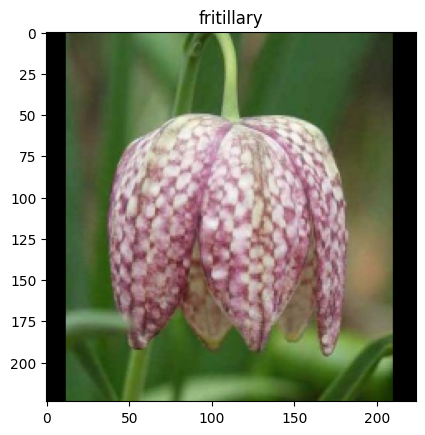

In [8]:
plt.imshow(img[0])
plt.title(f'{train_names[label[0]]}')

In [23]:
val_dataset, val_names = image_dataset_from_directory('All_flowers//val', image_size=(224, 224), batch_size=32, shuffle=True, seed=13)

In [10]:
iterr_val = iter(val_dataset)

In [11]:
img_val, label_val  = next(iterr_val)
label_val

<tf.Tensor: shape=(32,), dtype=int64, numpy=
array([  2,  16, 102,  44,  30,  34,  99,  26,  21,  57,   1,  84,  27,
        11,  75,  23, 108, 108,  34, 106,  94,  84,  84, 106,  60,  11,
        15,  96,  84,   4,  18,  57])>

Text(0.5, 1.0, 'artichoke')

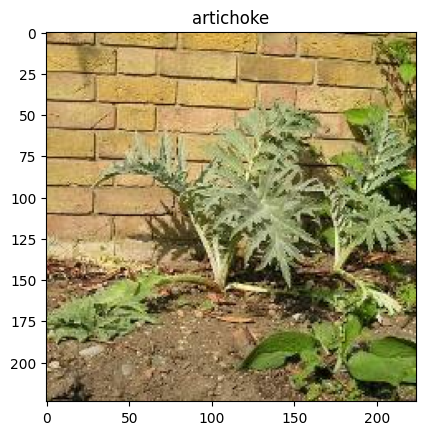

In [13]:
plt.imshow(img_val[0])
plt.title(f'{val_names[label_val[0]]}')

---
# 3. Создание модели, её обучение и тестирование с разными подходами поиска похожих фотографий

## 3.1. Модель свертки реализованная самостоятельно

In [6]:
initializer = tf.keras.initializers.HeNormal()

inputs = tf.keras.layers.Input((224, 224, 3), dtype=tf.float32, name="inputs")
input_norm = tf.keras.layers.BatchNormalization(name='b0')(inputs)


x = tf.keras.layers.Conv2D(64, (3, 3), padding='same', activation='relu', kernel_initializer=initializer, name='conv1')(input_norm)
x = tf.keras.layers.BatchNormalization(name=f'bn_1')(x)
x = tf.keras.layers.Conv2D(64, (3, 3), padding='same', activation='relu', kernel_initializer=initializer, name='conv2')(x)
x = tf.keras.layers.BatchNormalization(name=f'bn_2')(x)
x = tf.keras.layers.MaxPooling2D(pool_size=(2, 2), name='pool1')(x)
x = tf.keras.layers.Dropout(0.3, name='drop1')(x)

x = tf.keras.layers.Conv2D(128, (3, 3), padding='same', activation='relu', kernel_initializer=initializer, name='conv3')(x)
x = tf.keras.layers.BatchNormalization(name=f'bn_3')(x)
x = tf.keras.layers.Conv2D(128, (3, 3), padding='same', activation='relu', kernel_initializer=initializer, name='conv4')(x)
x = tf.keras.layers.BatchNormalization(name=f'bn_4')(x)
x = tf.keras.layers.MaxPooling2D(pool_size=(2, 2), name='pool2')(x)
x = tf.keras.layers.Dropout(0.5, name='drop2')(x)

x = tf.keras.layers.Conv2D(256, (3, 3), padding='same', activation='relu', kernel_initializer=initializer, name='conv5')(x)
x = tf.keras.layers.BatchNormalization(name=f'bn_5')(x)
x = tf.keras.layers.Conv2D(256, (3, 3), padding='same', activation='relu', kernel_initializer=initializer, name='conv6')(x)
x = tf.keras.layers.BatchNormalization(name=f'bn_6')(x)
x = tf.keras.layers.MaxPooling2D(pool_size=(2, 2), name='pool3')(x)

x = tf.keras.layers.Conv2D(256, (3, 3), padding='same', activation='relu', kernel_initializer=initializer, name='conv7')(x)
x = tf.keras.layers.MaxPooling2D(pool_size=(2, 2))(x)
x = tf.keras.layers.Conv2D(256, (3, 3), padding='same', activation='relu', kernel_initializer=initializer, name='conv8')(x)
x = tf.keras.layers.MaxPooling2D(pool_size=(2, 2), name='pool4')(x)

x = tf.keras.layers.Flatten(name='flatten1')(x)
x = tf.keras.layers.Dense(512, kernel_initializer=initializer, activation='relu', name='danse1')(x)
x = tf.keras.layers.BatchNormalization(name='bn1')(x)
x = tf.keras.layers.Dropout(0.5, name='drop3')(x)
x = tf.keras.layers.Dense(200, kernel_initializer=tf.keras.initializers.GlorotUniform(), name='danse2')(x)

model = tf.keras.Model(inputs=inputs, outputs=x, name='conv_img')

In [7]:
model.summary()

Model: "conv_img"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ inputs (InputLayer)             │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ b0 (BatchNormalization)         │ (None, 224, 224, 3)    │            12 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1 (Conv2D)                  │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bn_1 (BatchNormalization)       │ (None, 224, 224, 64)   │           256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2 (Conv2D)                  │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bn_2 (BatchNormalization)       │ (None, 224, 224, 64)   │           256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool1 (MaxPooling2D)            │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ drop1 (Dropout)                 │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv3 (Conv2D)                  │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bn_3 (BatchNormalization)       │ (None, 112, 112, 128)  │           512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv4 (Conv2D)                  │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bn_4 (BatchNormalization)       │ (None, 112, 112, 128)  │           512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool2 (MaxPooling2D)            │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ drop2 (Dropout)                 │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv5 (Conv2D)                  │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bn_5 (BatchNormalization)       │ (None, 56, 56, 256)    │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv6 (Conv2D)                  │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bn_6 (BatchNormalization)       │ (None, 56, 56, 256)    │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool3 (MaxPooling2D)            │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv7 (Conv2D)                  │ (None, 28, 28, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 14, 14, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv8 (Conv2D)                  │ (None, 14, 14, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool4 (MaxPooling2D)            │ (None, 7, 7, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten1 (Flatten)              │ (None, 12544)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ danse1 (Dense)                  │ (None, 512)            │     6,423,04

 Total params: 8,856,852 (33.79 MB)

 Trainable params: 8,854,030 (33.78 MB)

 Non-trainable params: 2,822 (11.02 KB)

In [8]:
model.compile(
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    optimizer='adam',
    metrics=['accuracy']
)

In [19]:
%load_ext tensorboard

In [20]:
HISTORY_DIR = './history'
os.makedirs(HISTORY_DIR, exist_ok=True)

In [21]:
logdir = os.path.join(HISTORY_DIR, datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

In [22]:
model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    os.path.join(logdir, 'model.keras'),
    save_best_only=True
)

In [23]:
tensorboard_callback = tf.keras.callbacks.TensorBoard(
    os.path.join(logdir, 'logs'),    
)

In [24]:
model.fit(train_dataset, validation_data=val_dataset, batch_size=32, epochs=20, callbacks=[model_checkpoint_callback, tensorboard_callback])

Epoch 1/20


I0000 00:00:1725363642.186432   47704 service.cc:145] XLA service 0x7fb3800034e0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1725363642.186487   47704 service.cc:153]   StreamExecutor device (0): NVIDIA GeForce RTX 4060 Laptop GPU, Compute Capability 8.9
2024-09-03 21:40:42.279302: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-09-03 21:40:42.652635: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:465] Loaded cuDNN version 8907
I0000 00:00:1725363672.991254   47704 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


699/699 ━━━━━━━━━━━━━━━━━━━━ 232s 284ms/step - accuracy: 0.1327 - loss: 4.1133 - val_accuracy: 0.2226 - val_loss: 3.1462
Epoch 2/20
699/699 ━━━━━━━━━━━━━━━━━━━━ 172s 245ms/step - accuracy: 0.2348 - loss: 3.0721 - val_accuracy: 0.2493 - val_loss: 2.9856
Epoch 3/20
699/699 ━━━━━━━━━━━━━━━━━━━━ 173s 248ms/step - accuracy: 0.2777 - loss: 2.8271 - val_accuracy: 0.3076 - val_loss: 2.6769
Epoch 4/20
699/699 ━━━━━━━━━━━━━━━━━━━━ 173s 247ms/step - accuracy: 0.3452 - loss: 2.5522 - val_accuracy: 0.3555 - val_loss: 2.4334
Epoch 5/20
699/699 ━━━━━━━━━━━━━━━━━━━━ 172s 246ms/step - accuracy: 0.4005 - loss: 2.3025 - val_accuracy: 0.3692 - val_loss: 3.3779
Epoch 6/20
699/699 ━━━━━━━━━━━━━━━━━━━━ 172s 246ms/step - accuracy: 0.4572 - loss: 2.0505 - val_accuracy: 0.4862 - val_loss: 5.0144
Epoch 7/20
699/699 ━━━━━━━━━━━━━━━━━━━━ 172s 246ms/step - accuracy: 0.5078 - loss: 1.7964 - val_accuracy: 0.5126 - val_loss: 1.9704
Epoch 8/20
699/699 ━━━━━━━━━━━━━━━━━━━━ 173s 248ms/step - accuracy: 0.4798 - loss: 1.96

Нет смысла обучать дальше, ведь модель переобучается

In [17]:
model.evaluate(val_dataset)

162/162 ━━━━━━━━━━━━━━━━━━━━ 10s 58ms/step - accuracy: 0.6422 - loss: 1.7974


[1.7953124046325684, 0.6383184790611267]

In [48]:
model.save_weights('weights_conv.weights.h5')

In [27]:
y_true = np.concatenate([y for x, y in val_dataset], axis=0)
y_pred = model.predict(val_dataset).argmax(axis=-1)

2024-09-03 22:49:51.211894: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


162/162 ━━━━━━━━━━━━━━━━━━━━ 9s 55ms/step


In [28]:
_, ax = plt.subplots(figsize=(75, 75))
sklearn.metrics.ConfusionMatrixDisplay.from_predictions(y_true, y_pred, ax=ax, colorbar=False)

plt.tight_layout()
# plt.savefig('valid.png')

## Сохранение и загрузка обученной модели

In [14]:
model.save('conv_model.keras')

In [24]:
model = load_model('conv_model.keras')

/home/dron46/anaconda3/envs/tf/lib/python3.10/site-packages/keras/src/saving/saving_lib.py:415: UserWarning: Skipping variable loading for optimizer 'adam', because it has 74 variables whereas the saved optimizer has 2 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


In [25]:
model.summary()

Model: "conv_img"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ inputs (InputLayer)             │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ b0 (BatchNormalization)         │ (None, 224, 224, 3)    │            12 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1 (Conv2D)                  │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bn_1 (BatchNormalization)       │ (None, 224, 224, 64)   │           256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2 (Conv2D)                  │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bn_2 (BatchNormalization)       │ (None, 224, 224, 64)   │           256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool1 (MaxPooling2D)            │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ drop1 (Dropout)                 │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv3 (Conv2D)                  │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bn_3 (BatchNormalization)       │ (None, 112, 112, 128)  │           512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv4 (Conv2D)                  │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bn_4 (BatchNormalization)       │ (None, 112, 112, 128)  │           512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool2 (MaxPooling2D)            │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ drop2 (Dropout)                 │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv5 (Conv2D)                  │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bn_5 (BatchNormalization)       │ (None, 56, 56, 256)    │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv6 (Conv2D)                  │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bn_6 (BatchNormalization)       │ (None, 56, 56, 256)    │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool3 (MaxPooling2D)            │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv7 (Conv2D)                  │ (None, 28, 28, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 14, 14, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv8 (Conv2D)                  │ (None, 14, 14, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool4 (MaxPooling2D)            │ (None, 7, 7, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten1 (Flatten)              │ (None, 12544)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ danse1 (Dense)                  │ (None, 512)            │     6,423,04

 Total params: 26,564,914 (101.34 MB)

 Trainable params: 8,854,030 (33.78 MB)

 Non-trainable params: 2,822 (11.02 KB)

 Optimizer params: 17,708,062 (67.55 MB)

In [26]:
model.input_shape

(None, 224, 224, 3)

#### 3.1.1 Получение похожих цветов, как первых самых вероятных классов

In [10]:
model.load_weights('weights_conv.weights.h5')

/home/dron46/anaconda3/envs/tf/lib/python3.10/site-packages/keras/src/saving/saving_lib.py:415: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 74 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


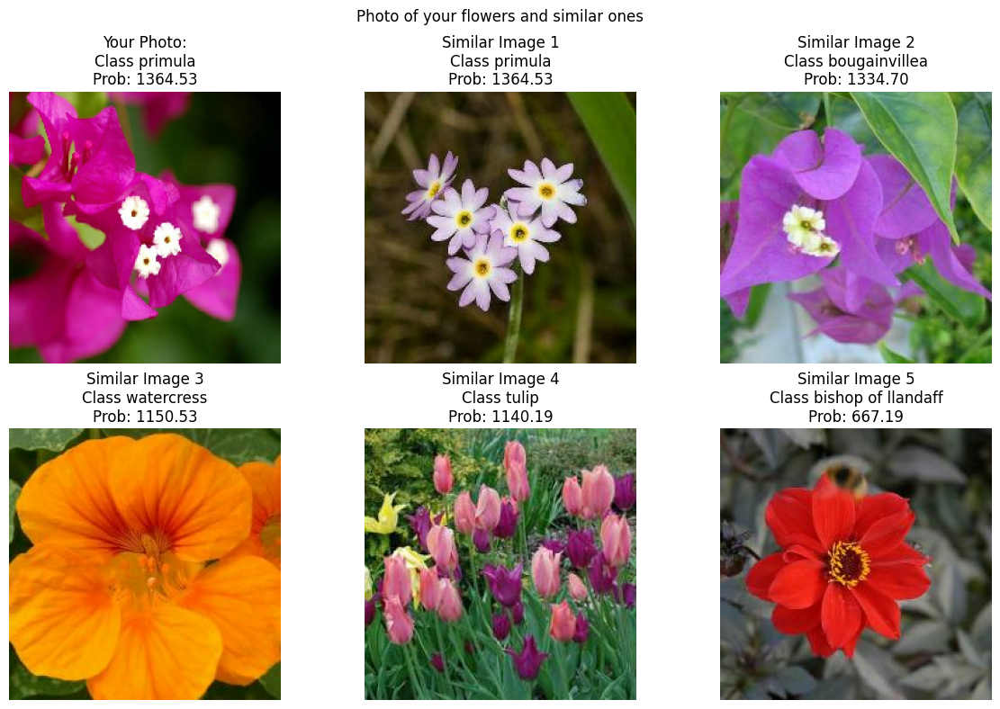

In [66]:
img_path = 'All_flowers/val/bougainvillea/1.jpg'

img = image.load_img(img_path, target_size=(224, 224))  
img_array = image.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0)  
img_array = tf.image.convert_image_dtype(img_array, tf.float32)

y_pred = model.predict(img_array)
predicted_class = np.argmax(y_pred, axis=1)[0]

def plot_images(images, titles, rows=2, cols=3):
    fig, axes = plt.subplots(rows, cols, figsize=(12, 8))
    plt.suptitle('Photo of your flowers and similar ones')
    for i, ax in enumerate(axes.flat):
        ax.imshow(images[i])
        ax.set_title(titles[i])
        ax.axis('off')
    plt.tight_layout()
    plt.show()


images = []
titles = []
images.append(img)
titles.append(f'Your Photo:\nClass {val_names[predicted_class]}\nProb: {y_pred[0][predicted_class]:.2f}')

top_k = 5
top_k_idx = np.argsort(y_pred[0])[-top_k:][::-1]
top_k_prob = y_pred[0][top_k_idx]


for idx, (class_idx, prob) in enumerate(zip(top_k_idx, top_k_prob)):
    for batch in val_dataset.as_numpy_iterator():
        imgs, labels = batch
        for img, label in zip(imgs, labels):
            if label == class_idx:
                images.append(img)
                titles.append(f'Similar Image {idx+1}\nClass {val_names[class_idx]}\nProb: {prob:.2f}')
                break
        if len(images) == idx + 2:
            break


plot_images(images, titles)

#### 3.1.2 Поиск похожих изображений за счёт извлечения признаков из фотографий и расчёта косинусного расстояния между ними

In [43]:
model.layers[-6].output

<KerasTensor shape=(None, 7, 7, 256), dtype=float32, sparse=False, name=keras_tensor_21>

Функция для извлечения признаков модели из последнего слоя свёртки (Conv2D), также будет использоваться в пункте 3.1.3

In [56]:
feature_extractor = tf.keras.Model(inputs=model.input, outputs=model.layers[-6].output)

def extract_features(image):
    image = np.expand_dims(image, axis=0)  
    features = feature_extractor(image)
    return features.numpy().squeeze()


features_dataset = []
images_dataset = []  
labels_dataset = []  

for images, labels in val_dataset:  
    for image, label in zip(images, labels):
        features = extract_features(image)
        features_dataset.append(features)
        images_dataset.append(image.numpy())  
        labels_dataset.append(label.numpy())  

features_dataset = np.array([features.flatten() for features in features_dataset])

2024-09-08 17:57:11.039274: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


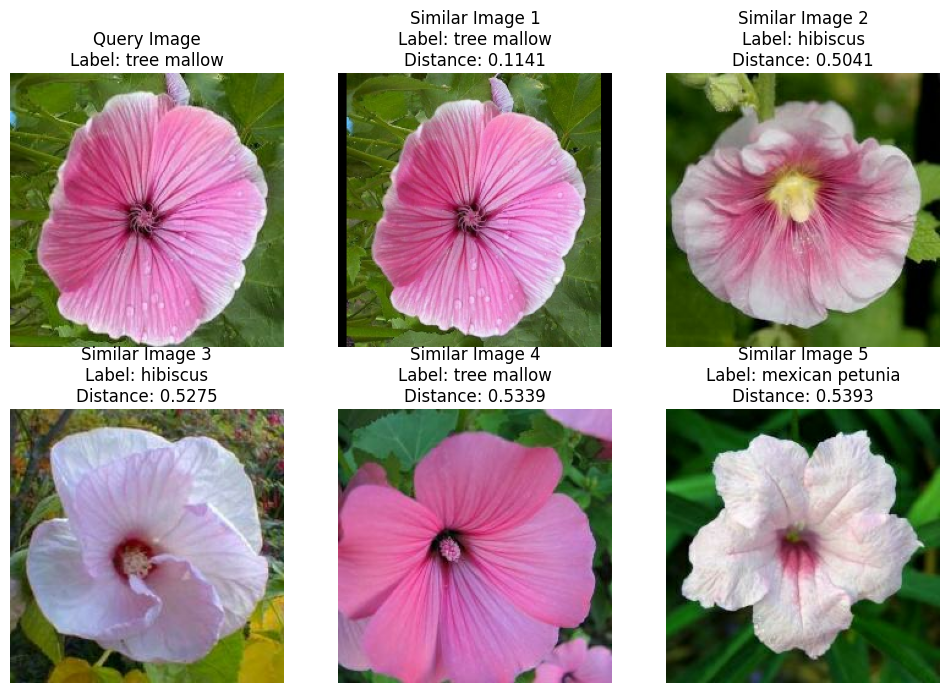

In [61]:
def cosine_distance(vec1, vec2):
    return 1 - np.dot(vec1, vec2) / (np.linalg.norm(vec1) * np.linalg.norm(vec2))


def find_similar_images(query_image, features_dataset):
    query_features = extract_features(query_image)
    query_features = query_features.flatten()
    distances = [cosine_distance(query_features, features) for features in features_dataset]
    sorted_indices = np.argsort(distances)
    return sorted_indices, distances


query_image = images_dataset[6] 
query_label = labels_dataset[6]  
sorted_idx, distances = find_similar_images(query_image, features_dataset)

filtered_indices = [idx for idx in sorted_idx if distances[idx] > 0]

plt.figure(figsize=(12, 8))

plt.subplot(2, 3, 1)
plt.title(f'Query Image\nClass: {val_names[query_label]}')
plt.imshow(query_image)
plt.axis('off')

for i, idx in enumerate(filtered_indices[:5]):
    similar_image = images_dataset[idx]
    similar_label = labels_dataset[idx]
    plt.subplot(2, 3, i + 2)
    plt.title(f'Similar Image {i+1}\nClass: {val_names[similar_label]}\nDistance: {distances[idx]:.4f}')
    plt.imshow(similar_image)
    plt.axis('off')

plt.show()

#### 3.1.3 Поиск похожих изображений за счёт извлечения признаков из фотографий и модели NearestNeighbors

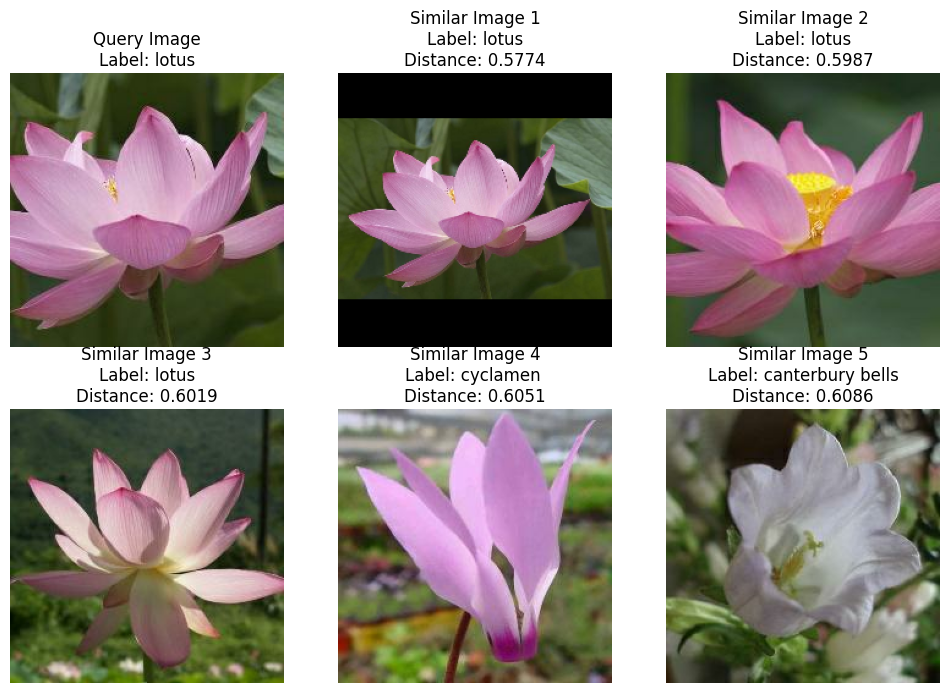

In [59]:
nn_model = NearestNeighbors(n_neighbors=6, metric='cosine')
nn_model.fit(features_dataset)

def find_similar_images2(query_image, nn_model, features_dataset):
    query_features = extract_features(query_image)
    query_features = query_features.flatten()
    distances, idx = nn_model.kneighbors([query_features])
    return distances, idx
    
query_image = images_dataset[9]  
query_label = labels_dataset[9]  
distances, similar_images_idx = find_similar_images2(query_image, nn_model, features_dataset)

filtered_distances = []
filtered_idx = []
for dist, idx in zip(distances[0], similar_images_idx[0]):
    if dist > 0.0005:  
        filtered_distances.append(dist)
        filtered_idx.append(idx)

plt.figure(figsize=(12, 8))


plt.subplot(2, 3, 1)
plt.title(f'Query Image\nClass: {val_names[query_label]}')
plt.imshow(query_image)
plt.axis('off')

for i, (idx, dist) in enumerate(zip(filtered_idx, filtered_distances)):
    similar_image = images_dataset[idx]
    similar_label = labels_dataset[idx]
    plt.subplot(2, 3, i + 2)
    plt.title(f'Similar Image {i+1}\nClass: {val_names[similar_label]}\nDistance: {dist:.4f}')
    plt.imshow(similar_image)
    plt.axis('off')

plt.show()

---
# 4. Поиск похожих фотографий с помощью CV - алгоритм SIFT

Создаю массивы с путями фотографий выбранной директории и их меткам

In [4]:
def paths_images_from_directory(
    directory: str,
    shuffle: bool = True,
    seed: int | None = None,
) -> tf.data.Dataset:

    class_names = []
    paths = []
    labels = []
    for class_name in os.listdir(directory): 
        class_path = os.path.join(directory, class_name)
        
        if not os.path.isdir(class_path):
            continue

        class_label = len(class_names)
        class_names.append(class_name)

        for file in os.listdir(class_path):
            if os.path.isdir(os.path.join(class_path, file)):
                continue
            paths.append(os.path.join(class_path, file))
            labels.append(class_label)
            
    paths = np.array(paths)
    labels = np.array(labels)
    
    if shuffle:   
        rng = np.random.default_rng(seed)
        index = rng.choice(len(labels), size=len(labels), replace=False)
        paths = paths[index]
        labels = labels[index]
    
    return paths, labels, class_names

In [5]:
train_paths, train_labels, train_class = paths_images_from_directory('All_flowers/train', shuffle=True, seed=13)

Поиск похожих изображений осуществляется с помощью алгоритма SIFT из библиотеки CV   
Для каждого изображения используется алгоритм SIFT (Scale-Invariant Feature Transform), который:
   - Находит ключевые точки (interest points) на изображении - это места, где изображение имеет сильные градиенты (резкие изменения яркости).
   - Вычисляет дескрипторы для каждой ключевой точки. Дескриптор - это 128-мерный вектор, который описывает локальную область изображения вокруг ключевой точки.
   - Дескрипторы SIFT инвариантны к поворотам, масштабированию и изменению освещения, что делает их подходящими для поиска похожих изображений.  

Для сравнения дескрипторов изображения запроса с дескрипторами изображений из датасета используется косинусное сходство. 

In [6]:
def search_for_similar_images_sift(query_image_path, image_paths, labels):

    query_image = cv2.imread(query_image_path)
    
    sift = cv2.SIFT_create()
    
    query_keypoints, query_descriptors = sift.detectAndCompute(query_image, None)
    
    dataset_features = []
    dataset_image_paths = []
    
    for i, image_path in enumerate(image_paths):
        image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
        keypoints, descriptors = sift.detectAndCompute(image, None)
        if descriptors is not None:  
            dataset_features.append(descriptors)
            dataset_image_paths.append(image_path)
    
    similarities = []
    for feature in dataset_features:
        if query_descriptors is not None and feature is not None:  
            similarity = cosine_similarity(query_descriptors, feature)
            similarities.append(similarity.mean())  
        else:
            similarities.append(0.0) 
    
    sorted_indices = np.argsort(similarities)[::-1]
    similar_image_paths = [dataset_image_paths[i] for i in sorted_indices]
    
    return similar_image_paths, similarities

Похожие изображения:
All_flowers//train/morning glory/086d5cc01.jpg
All_flowers//train/rose/141.jpg
All_flowers//train/giant white arum lily/5.jpg
All_flowers//train/dandelion/5f60a9472.jpg
All_flowers//train/cyclamen/38.jpg



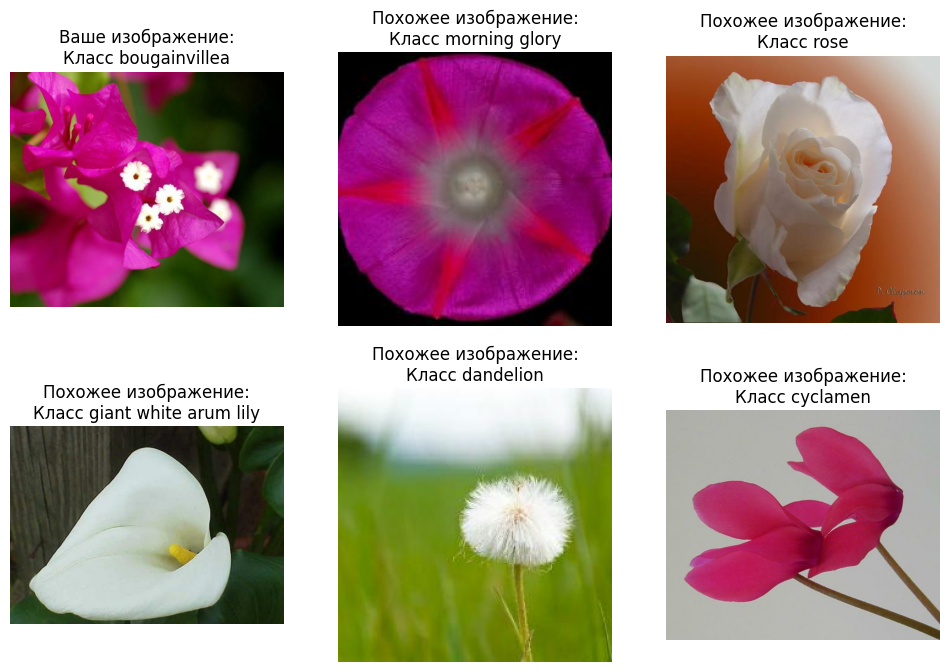

In [45]:
query_image_path = 'All_flowers/val/bougainvillea/1.jpg'
query_class = query_image_path.split('/')[2]

similar_images, similarities = search_for_similar_images_sift(query_image_path, train_paths, train_labels)

print("Похожие изображения:")
for path in similar_images[:5]:
    print(path)
print()

plt.figure(figsize=(12, 8))
plt.subplot(2, 3, 1)
plt.imshow(cv2.cvtColor(cv2.imread(query_image_path), cv2.COLOR_BGR2RGB))
plt.title(f"Ваше изображение:\nКласс {query_class}")
plt.axis('off')

for i, path in enumerate(similar_images[:5]):
    plt.subplot(2, 3, i + 2)
    img = cv2.imread(path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    label = train_labels[list(train_paths).index(path)] 
    plt.imshow(img)
    plt.title(f"Похожее изображение:\nКласс {train_class[label]}")
    plt.axis('off')

plt.show()

In [7]:
query_image_path2 = 'All_flowers/val/buttercup/4.jpg'
query_class2 = query_image_path2.split('/')[2]

similar_images2, similarities2 = search_for_similar_images_sift(query_image_path2, train_paths, train_labels)

Похожие изображения:
All_flowers//train/oxeye daisy/14354051035_1037b30421_n.jpg - Сходство: 0.5197
All_flowers//train/hippeastrum/52.jpg - Сходство: 0.5194
All_flowers//train/tulip/13509973805_bda5fa8982.jpg - Сходство: 0.5148
All_flowers//train/bird of paradise/30.jpg - Сходство: 0.5139
All_flowers//train/tulip/7f65b273d.jpg - Сходство: 0.5129



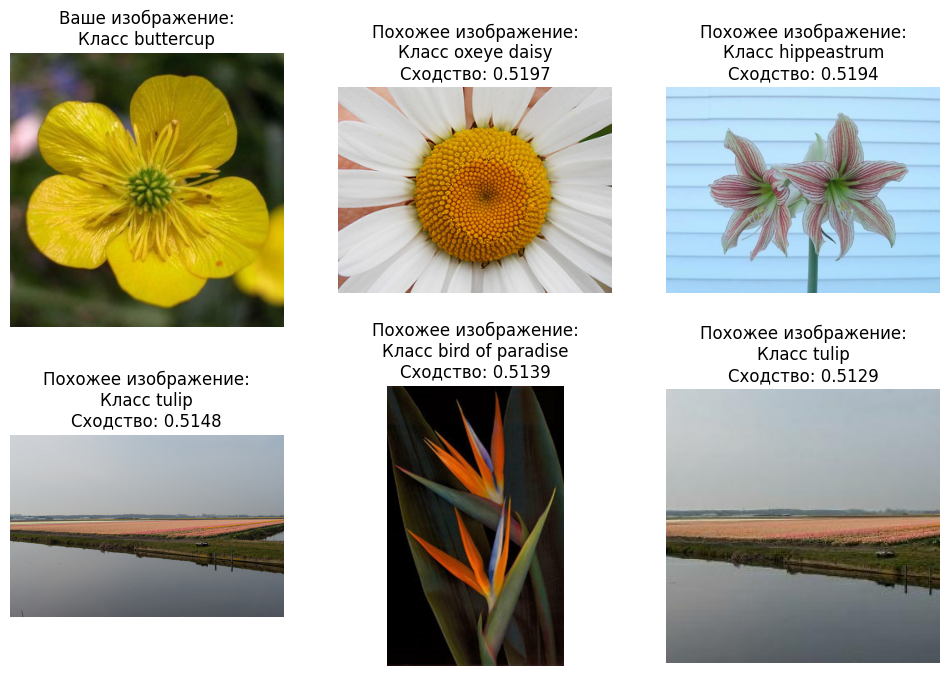

In [9]:
print("Похожие изображения:")
for path, similarity in zip(similar_images2[:5], np.sort(similarities2)[::-1][:5]):
    print(f"{path} - Сходство: {similarity:.4f}")
print()

plt.figure(figsize=(12, 8))
plt.subplot(2, 3, 1)
plt.imshow(cv2.cvtColor(cv2.imread(query_image_path2), cv2.COLOR_BGR2RGB))
plt.title(f"Ваше изображение:\nКласс {query_class2}")
plt.axis('off')

for i, (path, similarity) in enumerate(zip(similar_images2[:5], np.sort(similarities2)[::-1][:5])):
    plt.subplot(2, 3, i + 2)
    img = cv2.imread(path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    label = train_labels[list(train_paths).index(path)] 
    plt.imshow(img)
    plt.title(f"Похожее изображение:\nКласс {train_class[label]}\nСходство: {similarity:.4f}")
    plt.axis('off')

plt.show()

---
# 5. Кластеризация изображений

В данном пункте используется предобученная модель

- загрузим предобученную модель
- с помощью модели и других функций извлечем призаки из изображений
- понизим размерность полученных признаков с помощью PCA
- выполним кластеризацию, подберем оптимальное число кластеров методом локтя

In [6]:
dataset = train_dataset.concatenate(val_dataset)

In [7]:
model = tf.keras.applications.EfficientNetB0(include_top=False, pooling='avg')
feature_extractor_model = tf.keras.models.Model(inputs=model.input, outputs=model.output)

In [8]:
def extract_feature(butch):
    image_butch = tf.keras.applications.efficientnet.preprocess_input(butch)
    features = feature_extractor_model.predict(image_butch, verbose=0)
    return features

In [9]:
features = []
for butch, _ in dataset:
    feature = extract_feature(butch)
    features.append(feature)

2024-09-17 14:40:06.302018: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


In [10]:
print(len(features))
print(feature.shape)

861
(10, 1280)


In [11]:
features_array = np.concatenate(features, axis=0)

In [12]:
features_array.shape

(27516, 1280)

In [13]:
pca = PCA(n_components=50, random_state=42)
pca_features = pca.fit_transform(features_array)

In [14]:
pca_features.shape

(27516, 50)

## Kmeans

In [16]:
WCCS = []
for k in tqdm(range(2, 102)):
    kmeans_model = KMeans(n_clusters=k, random_state=42).fit(pca_features)
    WCCS.append(kmeans_model.inertia_)

  0%|          | 0/100 [00:00<?, ?it/s]

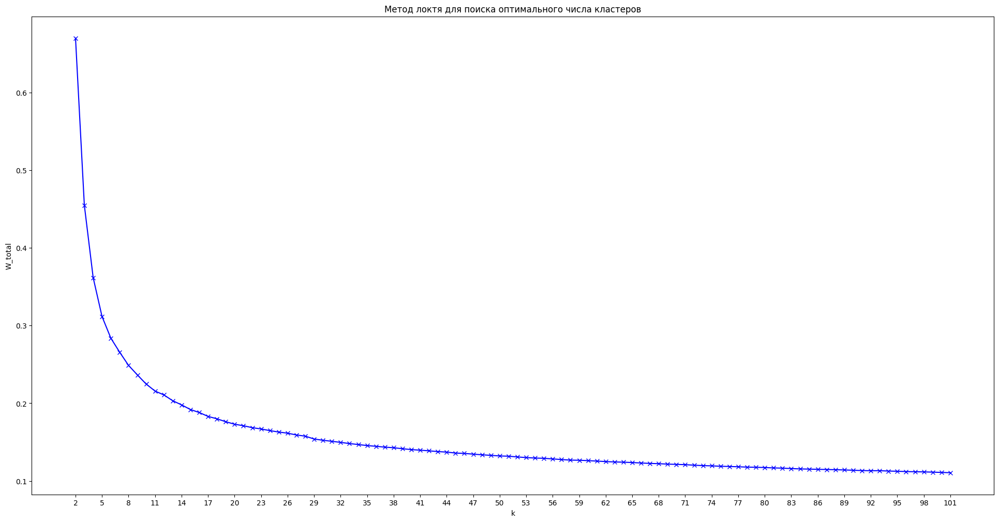

In [17]:
plt.figure(figsize=(24, 12))
plt.plot(np.arange(2, 102), WCCS, 'bx-')
plt.xlabel('k')
plt.ylabel('W_total')
plt.xticks(np.arange(2, 102, 3.0))
plt.title('Метод локтя для поиска оптимального числа кластеров')
plt.show()

In [20]:
metric = []
for k in range(2, 102):
    kmeans_model = KMeans(n_clusters=k, random_state=42)
    metric.append(silhouette_score(pca_features, kmeans_model.fit_predict(pca_features)))

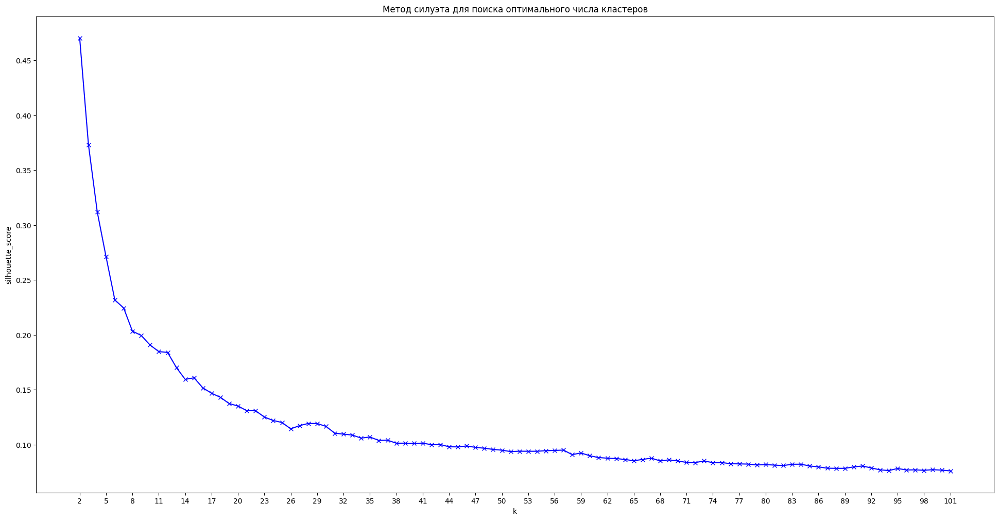

In [21]:
plt.figure(figsize=(24, 12))
plt.plot(np.arange(2, 102), metric, 'bx-')
plt.xlabel('k')
plt.ylabel('silhouette_score')
plt.xticks(np.arange(2, 102, 3.0))
plt.title('Метод силуэта для поиска оптимального числа кластеров')
plt.show()

In [15]:
kmeans_model = KMeans(n_clusters=7, random_state=42).fit(pca_features)

In [16]:
clusters = kmeans_model.predict(pca_features)

In [54]:
tsne_data = TSNE().fit_transform(pca_features)

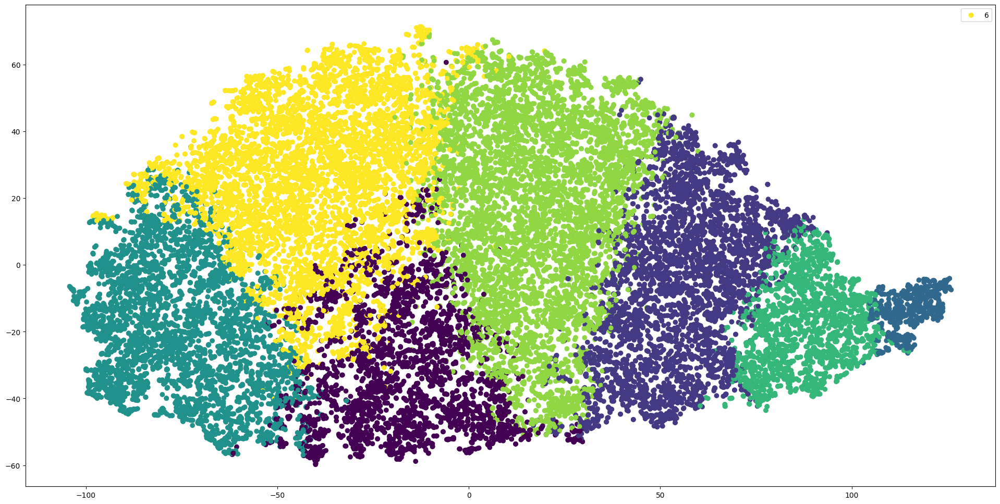

In [55]:
plt.figure(figsize=(24, 12))
plt.scatter(tsne_data[:, 0], tsne_data[:, 1], c=clusters)
plt.legend(clusters)
plt.show()

In [57]:
for i in range(7):
    print(f"в кластере {i} находится: {np.where(clusters == i, 1, 0).sum()}")

в кластере 0 находится: 3179
в кластере 1 находится: 4478
в кластере 2 находится: 619
в кластере 3 находится: 4312
в кластере 4 находится: 2085
в кластере 5 находится: 6568
в кластере 6 находится: 6275


In [59]:
idxs = np.argwhere(clusters == 6).flatten()
idxs.shape

(6275,)

In [79]:
def plot_cluster(dataset, clusters, cluster, n=4):
    # Выбираем случайные индексы
    idxs = np.argwhere(clusters == cluster)
    total_images = idxs.shape[0]
    random_indices = np.random.choice(total_images, n, replace=False)

    fig, axes = plt.subplots(2, 2, figsize=(12, 12))

    for ax, idx in zip(axes.flatten(), random_indices):
        # Находим батч и индекс внутри батча
        batch_idx = idx // 32
        img_idx = idx % 32

        # Извлекаем изображение и настоящую метку из датасета
        for batch_images, batch_labels in dataset.skip(batch_idx).take(1):
            image = batch_images[img_idx].numpy()
            true_label = batch_labels[img_idx].numpy()
            break


        ax.imshow(image)
        ax.set_title(f'True label: {train_names[true_label]}')
        ax.axis('off')
    plt.tight_layout()
    plt.show()

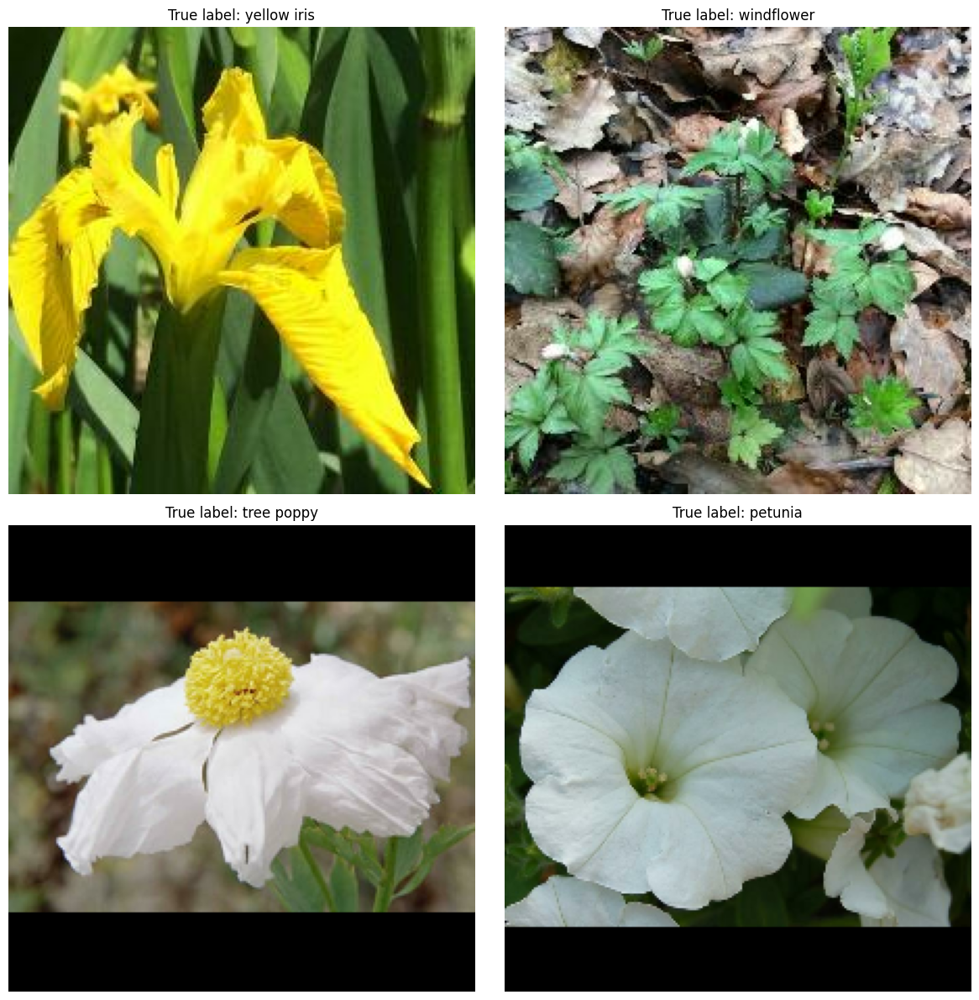

In [80]:
plot_cluster(dataset, clusters, 0)

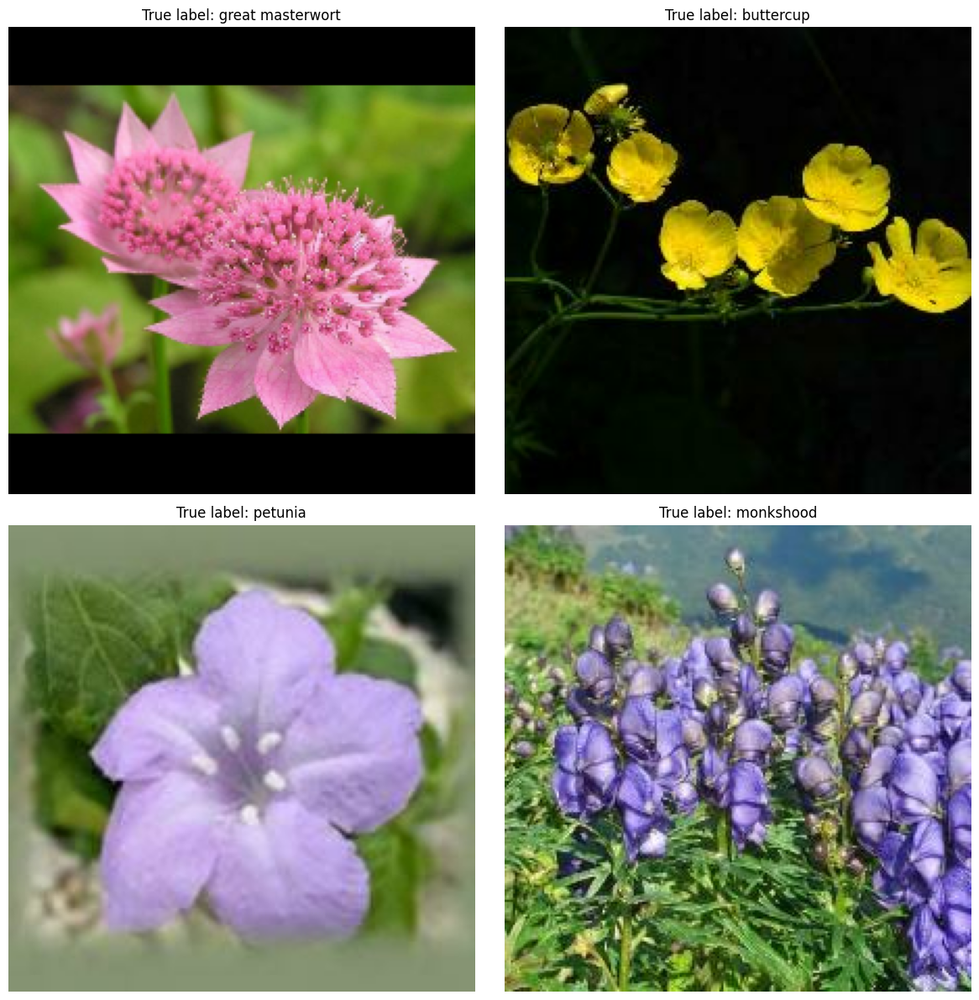

In [82]:
plot_cluster(dataset, clusters, 1)